<a href="https://colab.research.google.com/github/Juny2312/Analysis-health/blob/main/Calorie_Regression_by_juny2312___fst_competition!.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import pandas as pd
train = pd.read_csv('/content/drive/MyDrive/data/train.csv')
test = pd.read_csv('/content/drive/MyDrive/data/test.csv')
ss = pd.read_csv('/content/drive/MyDrive/data/sample_submission.csv')
#amazon.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import requests
from mysql import connector
import streamlit as st
import numpy as np
import seaborn as sbs
from matplotlib import pyplot as plt
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)

In [ ]:
test.head()

,ID,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Weight_Status,Gender,Age
0,TEST_0000,26.0,105.1,107.0,5.0,1.0,114.6,Normal Weight,F,45
1,TEST_0001,29.0,104.9,111.0,6.0,2.0,198.4,Overweight,M,21
2,TEST_0002,11.0,104.0,90.0,5.0,9.0,169.8,Normal Weight,M,58
3,TEST_0003,24.0,105.4,108.0,5.0,12.0,196.2,Overweight,M,35
4,TEST_0004,29.0,106.0,116.0,5.0,7.0,147.7,Normal Weight,F,67


In [ ]:
train.head()

,ID,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Weight_Status,Gender,Age,Calories_Burned
0,TRAIN_0000,26.0,105.6,107.0,5.0,9.0,154.3,Normal Weight,F,45,166.0
1,TRAIN_0001,7.0,103.3,88.0,6.0,6.0,224.9,Overweight,M,50,33.0
2,TRAIN_0002,7.0,103.3,86.0,6.0,3.0,218.3,Overweight,M,29,23.0
3,TRAIN_0003,17.0,104.0,99.0,5.0,6.0,147.7,Normal Weight,F,33,91.0
4,TRAIN_0004,9.0,102.7,88.0,5.0,10.0,169.8,Normal Weight,M,38,32.0


In [ ]:
train.isna()

,ID,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Weight_Status,Gender,Age,Calories_Burned
0,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...
7495,False,False,False,False,False,False,False,False,False,False,False
7496,False,False,False,False,False,False,False,False,False,False,False
7497,False,False,False,False,False,False,False,False,False,False,False
7498,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
import os
from sklearn.metrics import mean_absolute_error,r2_score
from sklearn.model_selection import train_test_split
from sklearn import linear_model

In [ ]:
import matplotlib.gridspec as gridspec
from wordcloud import WordCloud, STOPWORDS
plt.style.use('seaborn')
sbs.set_style('whitegrid')
%matplotlib inline

In [ ]:
train.isnull().sum()

ID                          0
Exercise_Duration           0
Body_Temperature(F)         0
BPM                         0
Height(Feet)                0
Height(Remainder_Inches)    0
Weight(lb)                  0
Weight_Status               0
Gender                      0
Age                         0
Calories_Burned             0
dtype: int64

In [ ]:
train.sort_values(by=['Exercise_Duration'])

,ID,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Weight_Status,Gender,Age,Calories_Burned
3780,TRAIN_3780,1.0,100.2,91.0,5.0,8.0,174.2,Overweight,M,60,5.0
1545,TRAIN_1545,1.0,99.5,75.0,5.0,12.0,178.6,Normal Weight,M,20,1.0
7476,TRAIN_7476,1.0,99.3,82.0,6.0,6.0,213.8,Normal Weight,M,37,3.0
5017,TRAIN_5017,1.0,99.5,84.0,5.0,2.0,132.3,Normal Weight,F,68,4.0
5916,TRAIN_5916,1.0,99.9,77.0,6.0,2.0,196.2,Overweight,M,38,2.0
...,...,...,...,...,...,...,...,...,...,...,...
859,TRAIN_0859,30.0,105.6,104.0,4.0,8.0,114.6,Overweight,F,30,182.0
5291,TRAIN_5291,30.0,105.4,102.0,5.0,7.0,160.9,Overweight,F,68,187.0
5294,TRAIN_5294,30.0,105.6,104.0,6.0,0.0,183.0,Normal Weight,M,38,184.0
1064,TRAIN_1064,30.0,105.3,115.0,6.0,2.0,207.2,Overweight,M,27,225.0


In [ ]:
label1 = train[['Exercise_Duration','Calories_Burned']]

In [ ]:
label1

,Exercise_Duration,Calories_Burned
0,26.0,166.0
1,7.0,33.0
2,7.0,23.0
3,17.0,91.0
4,9.0,32.0
...,...,...
7495,22.0,151.0
7496,20.0,114.0
7497,8.0,41.0
7498,12.0,57.0


In [ ]:
label1.sort_values(by=['Exercise_Duration']) # 범주형 데이터 다루기

,Exercise_Duration,Calories_Burned
3780,1.0,5.0
1545,1.0,1.0
7476,1.0,3.0
5017,1.0,4.0
5916,1.0,2.0
...,...,...
859,30.0,182.0
5291,30.0,187.0
5294,30.0,184.0
1064,30.0,225.0


In [ ]:
cor = label1.copy().corr() #['Calories_Burned'] 0 < p < 1 represents proportional relationship.

In [ ]:
cor # Calorie Consumption and Physical momentum are propotional

,Exercise_Duration,Calories_Burned
Exercise_Duration,1.000000,0.954783
Calories_Burned,0.954783,1.000000


In [ ]:
cor_pear = label1.copy().corr(method='pearson') #['Calories_Burned']

In [ ]:
cor_pear

,Exercise_Duration,Calories_Burned
Exercise_Duration,1.000000,0.954783
Calories_Burned,0.954783,1.000000


In [ ]:
# y : Calorie Consumption
# X(x1,x2,x3,...) : bio

In [ ]:
label2 = train[['Body_Temperature(F)','BPM',	'Height(Feet)','Height(Remainder_Inches)','Weight(lb)','Weight_Status','Gender','Age']]

In [ ]:
label2

,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Weight_Status,Gender,Age
0,105.6,107.0,5.0,9.0,154.3,Normal Weight,F,45
1,103.3,88.0,6.0,6.0,224.9,Overweight,M,50
2,103.3,86.0,6.0,3.0,218.3,Overweight,M,29
3,104.0,99.0,5.0,6.0,147.7,Normal Weight,F,33
4,102.7,88.0,5.0,10.0,169.8,Normal Weight,M,38
...,...,...,...,...,...,...,...,...
7495,105.1,104.0,4.0,10.0,112.4,Normal Weight,F,75
7496,105.3,104.0,5.0,8.0,147.7,Normal Weight,F,21
7497,103.1,90.0,6.0,2.0,202.8,Overweight,M,57
7498,104.4,97.0,5.0,9.0,167.6,Overweight,M,35


In [ ]:
label3 = train[['Exercise_Duration','Body_Temperature(F)','BPM',	'Height(Feet)','Height(Remainder_Inches)','Weight(lb)','Weight_Status','Gender','Age']]

In [ ]:
label3

,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Weight_Status,Gender,Age
0,26.0,105.6,107.0,5.0,9.0,154.3,Normal Weight,F,45
1,7.0,103.3,88.0,6.0,6.0,224.9,Overweight,M,50
2,7.0,103.3,86.0,6.0,3.0,218.3,Overweight,M,29
3,17.0,104.0,99.0,5.0,6.0,147.7,Normal Weight,F,33
4,9.0,102.7,88.0,5.0,10.0,169.8,Normal Weight,M,38
...,...,...,...,...,...,...,...,...,...
7495,22.0,105.1,104.0,4.0,10.0,112.4,Normal Weight,F,75
7496,20.0,105.3,104.0,5.0,8.0,147.7,Normal Weight,F,21
7497,8.0,103.1,90.0,6.0,2.0,202.8,Overweight,M,57
7498,12.0,104.4,97.0,5.0,9.0,167.6,Overweight,M,35


In [ ]:
#categorize2 = pd.get_dummies(label2['Gender'])

In [ ]:
#categorize2

In [ ]:
label4 = train['Calories_Burned']

In [ ]:
label4

0       166.0
1        33.0
2        23.0
3        91.0
4        32.0
        ...  
7495    151.0
7496    114.0
7497     41.0
7498     57.0
7499     59.0
Name: Calories_Burned, Length: 7500, dtype: float64

In [ ]:
#fig = sbs.pairplot(label3)

In [ ]:
# gender_ex = label3['Gender'] = pd.get_dummies(label3['Gender'], prefix_sep='_', drop_first=True)
# gender_ex.head() # female 0 , male 1

In [ ]:
label3.drop_duplicates(['Weight_Status'], keep='first')

,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Weight_Status,Gender,Age
0,26.0,105.6,107.0,5.0,9.0,154.3,Normal Weight,F,45
1,7.0,103.3,88.0,6.0,6.0,224.9,Overweight,M,50
23,8.0,103.5,96.0,5.0,3.0,138.9,Obese,F,34


In [ ]:
categorize = pd.get_dummies(label3['Weight_Status'])

In [ ]:
categorize

,Normal Weight,Obese,Overweight
0,1,0,0
1,0,0,1
2,0,0,1
3,1,0,0
4,1,0,0
...,...,...,...
7495,1,0,0
7496,1,0,0
7497,0,0,1
7498,0,0,1


In [ ]:
categorize2 = pd.get_dummies(label3['Gender'])

In [ ]:
categorize2

,F,M
0,1,0
1,0,1
2,0,1
3,1,0
4,0,1
...,...,...
7495,1,0
7496,1,0
7497,0,1
7498,0,1


In [ ]:
new_label3 = pd.concat([label3, categorize],axis=1)

In [ ]:
new_label3

,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Weight_Status,Gender,Age,Normal Weight,Obese,Overweight
0,26.0,105.6,107.0,5.0,9.0,154.3,Normal Weight,F,45,1,0,0
1,7.0,103.3,88.0,6.0,6.0,224.9,Overweight,M,50,0,0,1
2,7.0,103.3,86.0,6.0,3.0,218.3,Overweight,M,29,0,0,1
3,17.0,104.0,99.0,5.0,6.0,147.7,Normal Weight,F,33,1,0,0
4,9.0,102.7,88.0,5.0,10.0,169.8,Normal Weight,M,38,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
7495,22.0,105.1,104.0,4.0,10.0,112.4,Normal Weight,F,75,1,0,0
7496,20.0,105.3,104.0,5.0,8.0,147.7,Normal Weight,F,21,1,0,0
7497,8.0,103.1,90.0,6.0,2.0,202.8,Overweight,M,57,0,0,1
7498,12.0,104.4,97.0,5.0,9.0,167.6,Overweight,M,35,0,0,1


In [ ]:
#new_label3 = new_label3.drop(['Weight_Status'],axis=1)

In [ ]:
#fig = sbs.pairplot(new_label3)

In [ ]:
new_label3_2 = pd.concat([new_label3, categorize2],axis=1)

In [ ]:
new_label3_2

,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Weight_Status,Gender,Age,Normal Weight,Obese,Overweight,F,M
0,26.0,105.6,107.0,5.0,9.0,154.3,Normal Weight,F,45,1,0,0,1,0
1,7.0,103.3,88.0,6.0,6.0,224.9,Overweight,M,50,0,0,1,0,1
2,7.0,103.3,86.0,6.0,3.0,218.3,Overweight,M,29,0,0,1,0,1
3,17.0,104.0,99.0,5.0,6.0,147.7,Normal Weight,F,33,1,0,0,1,0
4,9.0,102.7,88.0,5.0,10.0,169.8,Normal Weight,M,38,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,22.0,105.1,104.0,4.0,10.0,112.4,Normal Weight,F,75,1,0,0,1,0
7496,20.0,105.3,104.0,5.0,8.0,147.7,Normal Weight,F,21,1,0,0,1,0
7497,8.0,103.1,90.0,6.0,2.0,202.8,Overweight,M,57,0,0,1,0,1
7498,12.0,104.4,97.0,5.0,9.0,167.6,Overweight,M,35,0,0,1,0,1


In [ ]:
#new_label3 = new_label3_2.drop(['F','M'],axis=1)

In [ ]:
#new_label3 # Gender 0,1 Binary Column Created

In [ ]:
new_label3_2['Gender'] = pd.get_dummies(new_label3_2['Gender'], prefix_sep='_', drop_first=True)
new_label3_2.head() # Whole Column to train


,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Weight_Status,Gender,Age,Normal Weight,Obese,Overweight,F,M
0,26.0,105.6,107.0,5.0,9.0,154.3,Normal Weight,0,45,1,0,0,1,0
1,7.0,103.3,88.0,6.0,6.0,224.9,Overweight,1,50,0,0,1,0,1
2,7.0,103.3,86.0,6.0,3.0,218.3,Overweight,1,29,0,0,1,0,1
3,17.0,104.0,99.0,5.0,6.0,147.7,Normal Weight,0,33,1,0,0,1,0
4,9.0,102.7,88.0,5.0,10.0,169.8,Normal Weight,1,38,1,0,0,0,1


In [ ]:
new_label3_5 = new_label3_2.drop(['Weight_Status'],axis=1)

In [ ]:
new_label3_5

,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Gender,Age,Normal Weight,Obese,Overweight,F,M
0,26.0,105.6,107.0,5.0,9.0,154.3,0,45,1,0,0,1,0
1,7.0,103.3,88.0,6.0,6.0,224.9,1,50,0,0,1,0,1
2,7.0,103.3,86.0,6.0,3.0,218.3,1,29,0,0,1,0,1
3,17.0,104.0,99.0,5.0,6.0,147.7,0,33,1,0,0,1,0
4,9.0,102.7,88.0,5.0,10.0,169.8,1,38,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,22.0,105.1,104.0,4.0,10.0,112.4,0,75,1,0,0,1,0
7496,20.0,105.3,104.0,5.0,8.0,147.7,0,21,1,0,0,1,0
7497,8.0,103.1,90.0,6.0,2.0,202.8,1,57,0,0,1,0,1
7498,12.0,104.4,97.0,5.0,9.0,167.6,1,35,0,0,1,0,1


In [ ]:
new_label3_3 = new_label3_2.drop(['Gender'],axis=1)

In [ ]:
new_label3_3 # F,M Categorizing each Coloumn

,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Weight_Status,Age,Normal Weight,Obese,Overweight,F,M
0,26.0,105.6,107.0,5.0,9.0,154.3,Normal Weight,45,1,0,0,1,0
1,7.0,103.3,88.0,6.0,6.0,224.9,Overweight,50,0,0,1,0,1
2,7.0,103.3,86.0,6.0,3.0,218.3,Overweight,29,0,0,1,0,1
3,17.0,104.0,99.0,5.0,6.0,147.7,Normal Weight,33,1,0,0,1,0
4,9.0,102.7,88.0,5.0,10.0,169.8,Normal Weight,38,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,22.0,105.1,104.0,4.0,10.0,112.4,Normal Weight,75,1,0,0,1,0
7496,20.0,105.3,104.0,5.0,8.0,147.7,Normal Weight,21,1,0,0,1,0
7497,8.0,103.1,90.0,6.0,2.0,202.8,Overweight,57,0,0,1,0,1
7498,12.0,104.4,97.0,5.0,9.0,167.6,Overweight,35,0,0,1,0,1


In [ ]:
cor2 = new_label3_2.copy().corr()

In [ ]:
cor2


,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Gender,Age,Normal Weight,Obese,Overweight,F,M
Exercise_Duration,1.000000,0.904314,0.853489,-0.004566,0.003649,0.002236,0.007789,0.017734,-0.015655,0.005310,0.014095,-0.007789,0.007789
Body_Temperature(F),0.904314,1.000000,0.770707,0.004248,-0.003311,0.007554,0.012012,0.016474,-0.014996,0.003367,0.014090,-0.012012,0.012012
BPM,0.853489,0.770707,1.000000,0.003110,0.004244,0.012562,0.016898,0.014702,-0.023626,0.000075,0.023989,-0.016898,0.016898
Height(Feet),-0.004566,0.004248,0.003110,1.000000,-0.536675,0.821749,0.593454,0.015356,-0.355408,0.096954,0.328079,-0.593454,0.593454
Height(Remainder_Inches),0.003649,-0.003311,0.004244,-0.536675,1.000000,-0.025702,0.001421,-0.011303,0.002119,-0.005403,-0.000305,-0.001421,0.001421
Weight(lb),0.002236,0.007554,0.012562,0.821749,-0.025702,1.000000,0.779709,0.090536,-0.596259,0.111696,0.567849,-0.779709,0.779709
Gender,0.007789,0.012012,0.016898,0.593454,0.001421,0.779709,1.000000,0.006035,-0.586168,0.088348,0.565581,-1.000000,1.000000
Age,0.017734,0.016474,0.014702,0.015356,-0.011303,0.090536,0.006035,1.000000,-0.181541,0.005552,0.182628,-0.006035,0.006035
Normal Weight,-0.015655,-0.014996,-0.023626,-0.355408,0.002119,-0.596259,-0.586168,-0.181541,1.000000,-0.216016,-0.942536,0.586168,-0.586168
Obese,0.005310,0.003367,0.000075,0.096954,-0.005403,0.111696,0.088348,0.005552,-0.216016,1.000000,-0.122614,-0.088348,0.088348


<Axes: >

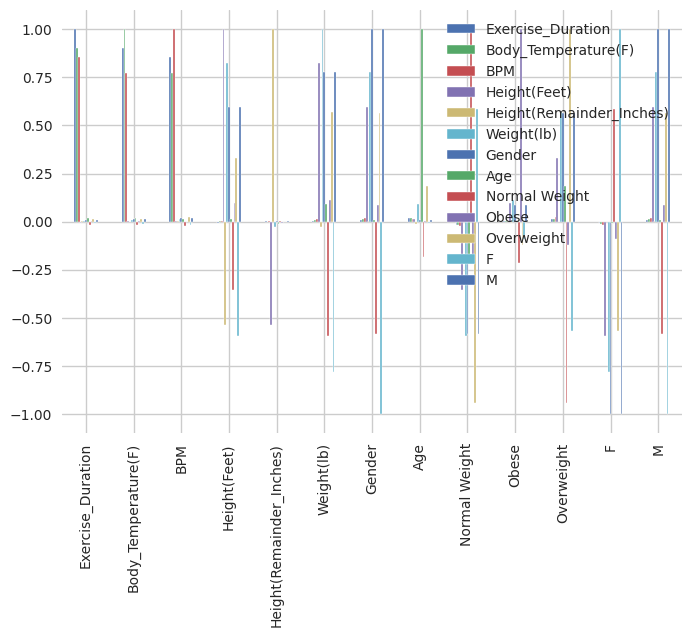

In [ ]:
cor2.plot.bar()

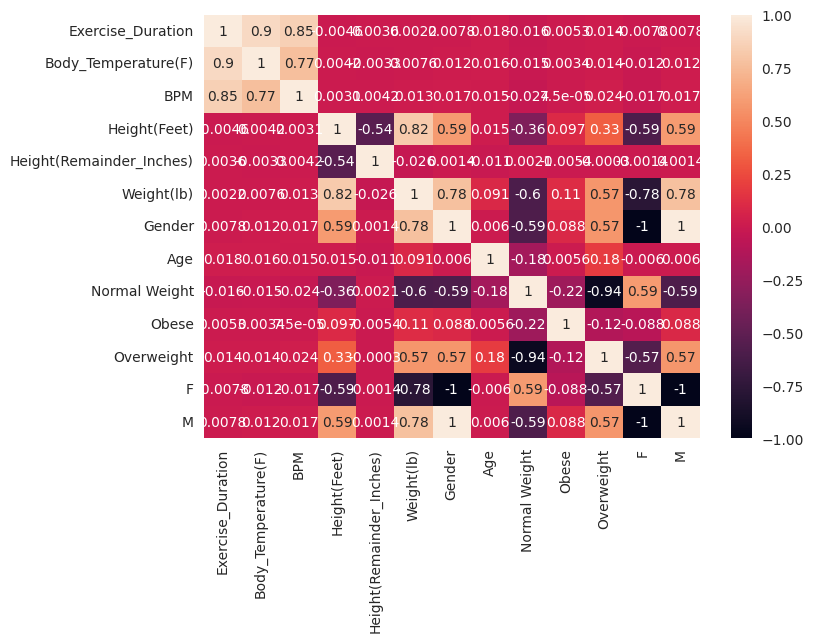

In [ ]:
ax = sbs.heatmap(cor2, annot=True)#, annot_kws=dict(color='g'), cmap='Greys')
plt.show()

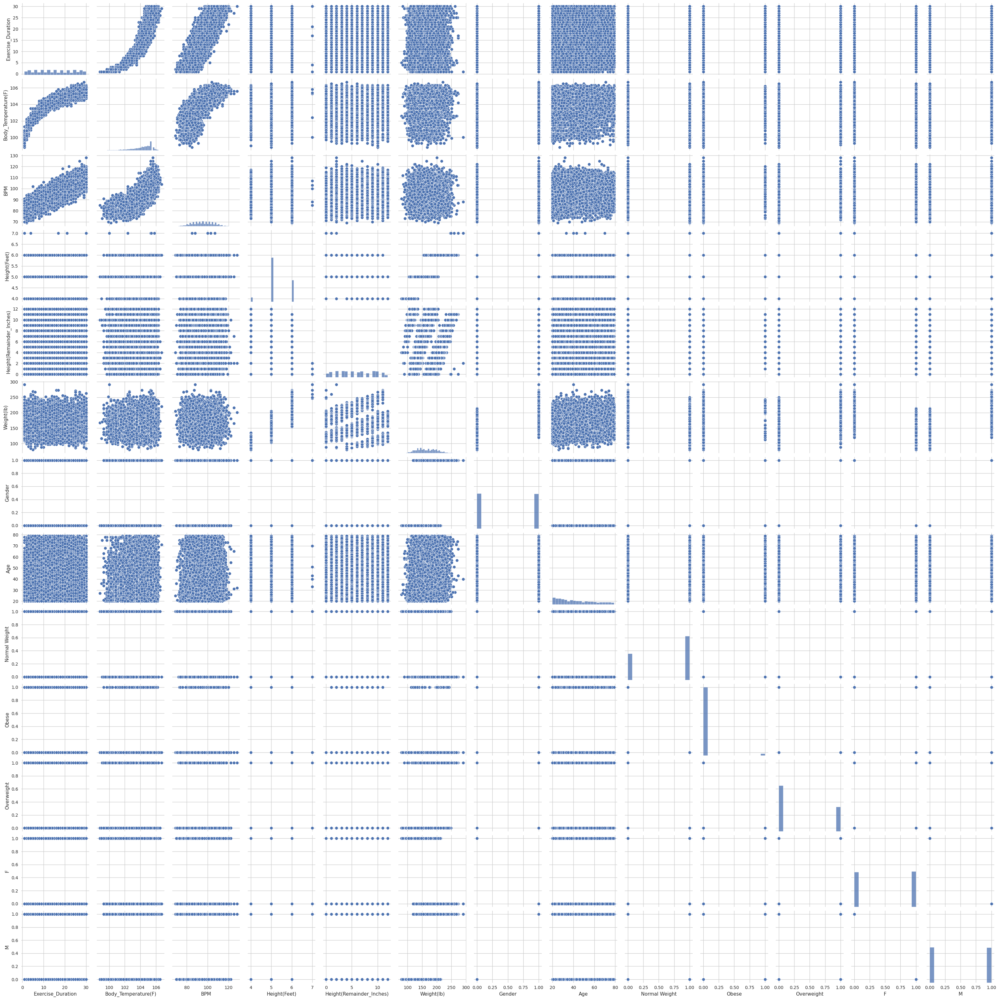

In [ ]:
fig2 = sbs.pairplot(new_label3_2)

In [ ]:
new_Range1 = new_label3_2[['Exercise_Duration','Body_Temperature(F)', 'BPM']]

In [ ]:
new_Range1

,Exercise_Duration,Body_Temperature(F),BPM
0,26.0,105.6,107.0
1,7.0,103.3,88.0
2,7.0,103.3,86.0
3,17.0,104.0,99.0
4,9.0,102.7,88.0
...,...,...,...
7495,22.0,105.1,104.0
7496,20.0,105.3,104.0
7497,8.0,103.1,90.0
7498,12.0,104.4,97.0


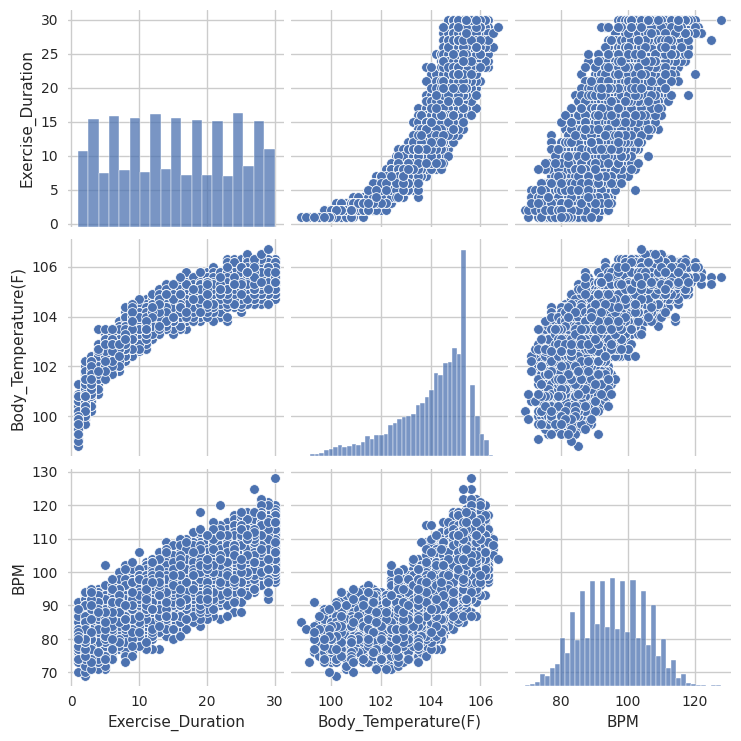

In [ ]:
fig3 = sbs.pairplot(new_Range1)

In [ ]:
new_Range2 = new_label3_2[['Height(Feet)',	'Height(Remainder_Inches)',	'Weight(lb)',	'Gender',	'Age',	'Normal Weight',	'Obese',	'Overweight',	'F',	'M']]

In [ ]:
new_Range2

,Height(Feet),Height(Remainder_Inches),Weight(lb),Gender,Age,Normal Weight,Obese,Overweight,F,M
0,5.0,9.0,154.3,0,45,1,0,0,1,0
1,6.0,6.0,224.9,1,50,0,0,1,0,1
2,6.0,3.0,218.3,1,29,0,0,1,0,1
3,5.0,6.0,147.7,0,33,1,0,0,1,0
4,5.0,10.0,169.8,1,38,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...
7495,4.0,10.0,112.4,0,75,1,0,0,1,0
7496,5.0,8.0,147.7,0,21,1,0,0,1,0
7497,6.0,2.0,202.8,1,57,0,0,1,0,1
7498,5.0,9.0,167.6,1,35,0,0,1,0,1


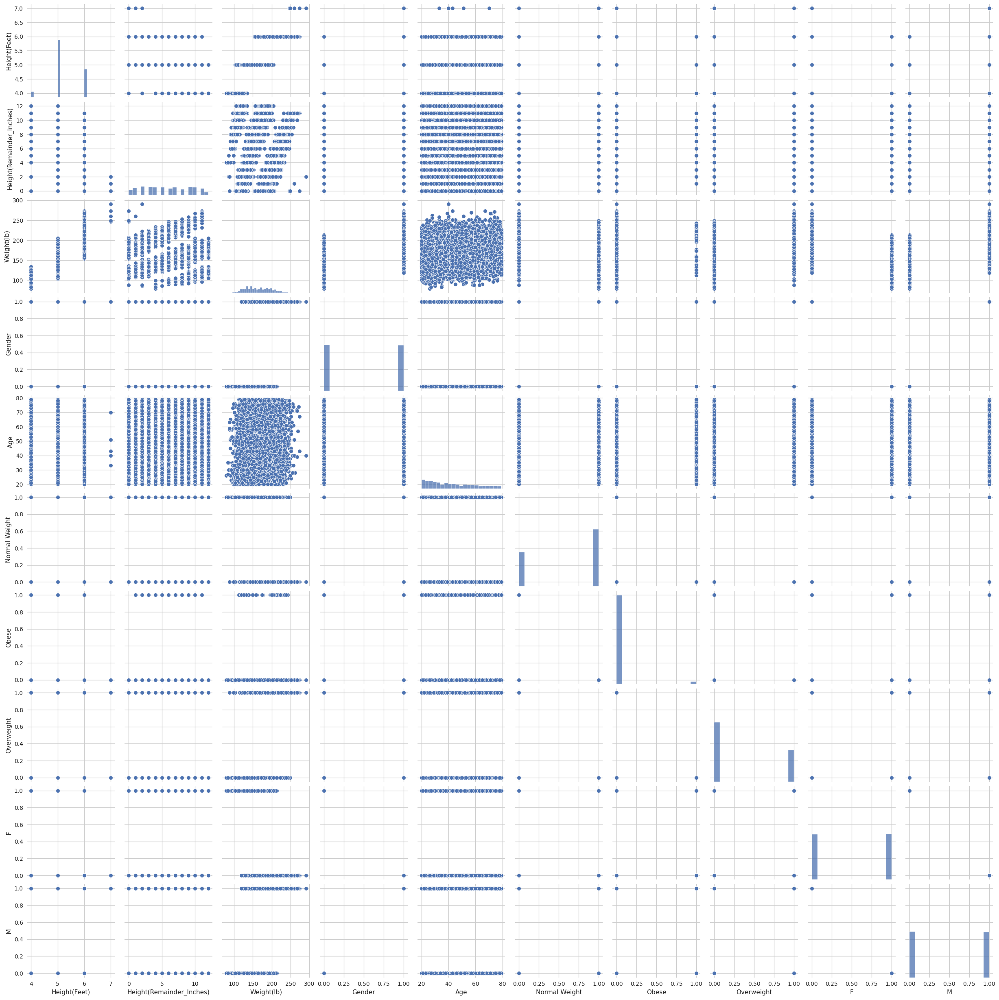

In [ ]:
fig4 = sbs.pairplot(new_Range2)

In [ ]:
# main factor modeling

In [ ]:
arr = np.array([1,2,3])

In [ ]:
arr.shape

(3,)

In [ ]:
arr

array([1, 2, 3])

In [ ]:
arr2= arr.reshape(-1,1)

In [ ]:
arr2

array([[1],
       [2],
       [3]])

In [ ]:
major_factors = new_Range1#.to_numpy()

In [ ]:
major_factors # multivariated x

,Exercise_Duration,Body_Temperature(F),BPM
0,26.0,105.6,107.0
1,7.0,103.3,88.0
2,7.0,103.3,86.0
3,17.0,104.0,99.0
4,9.0,102.7,88.0
...,...,...,...
7495,22.0,105.1,104.0
7496,20.0,105.3,104.0
7497,8.0,103.1,90.0
7498,12.0,104.4,97.0


In [ ]:
y1 = label4

In [ ]:
y1 # Value of y Class

0       166.0
1        33.0
2        23.0
3        91.0
4        32.0
        ...  
7495    151.0
7496    114.0
7497     41.0
7498     57.0
7499     59.0
Name: Calories_Burned, Length: 7500, dtype: float64

In [ ]:
# Additional EDA

In [ ]:
new_label3_5

,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Gender,Age,Normal Weight,Obese,Overweight,F,M
0,26.0,105.6,107.0,5.0,9.0,154.3,0,45,1,0,0,1,0
1,7.0,103.3,88.0,6.0,6.0,224.9,1,50,0,0,1,0,1
2,7.0,103.3,86.0,6.0,3.0,218.3,1,29,0,0,1,0,1
3,17.0,104.0,99.0,5.0,6.0,147.7,0,33,1,0,0,1,0
4,9.0,102.7,88.0,5.0,10.0,169.8,1,38,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,22.0,105.1,104.0,4.0,10.0,112.4,0,75,1,0,0,1,0
7496,20.0,105.3,104.0,5.0,8.0,147.7,0,21,1,0,0,1,0
7497,8.0,103.1,90.0,6.0,2.0,202.8,1,57,0,0,1,0,1
7498,12.0,104.4,97.0,5.0,9.0,167.6,1,35,0,0,1,0,1


In [ ]:
new_label3_5['BPM'].max() # 69~ 128 , Usually People in sampling works Between Only low- and moderate-intensity exercise. (Possiblity to divide Columns with 2 ways)

128.0

In [ ]:
new_label3_5['exercise_strengh'] = 0

In [ ]:
new_label3_5

,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Gender,Age,Normal Weight,Obese,Overweight,F,M,exercise_strengh
0,26.0,105.6,107.0,5.0,9.0,154.3,0,45,1,0,0,1,0,0
1,7.0,103.3,88.0,6.0,6.0,224.9,1,50,0,0,1,0,1,0
2,7.0,103.3,86.0,6.0,3.0,218.3,1,29,0,0,1,0,1,0
3,17.0,104.0,99.0,5.0,6.0,147.7,0,33,1,0,0,1,0,0
4,9.0,102.7,88.0,5.0,10.0,169.8,1,38,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,22.0,105.1,104.0,4.0,10.0,112.4,0,75,1,0,0,1,0,0
7496,20.0,105.3,104.0,5.0,8.0,147.7,0,21,1,0,0,1,0,0
7497,8.0,103.1,90.0,6.0,2.0,202.8,1,57,0,0,1,0,1,0
7498,12.0,104.4,97.0,5.0,9.0,167.6,1,35,0,0,1,0,1,0


In [ ]:
new_label3_5.loc[new_label3_5['BPM'] <= 121, 'exercise_strengh'] = 'low'

In [ ]:
new_label3_5.loc[(new_label3_5['BPM'] > 121) & (new_label3_5['BPM'] <= 145), 'exercise_strengh'] = 'mid'

In [ ]:
new_label3_5.max()

Exercise_Duration                    30.0
Body_Temperature(F)                 106.7
BPM                                 128.0
Height(Feet)                          7.0
Height(Remainder_Inches)             12.0
Weight(lb)                          291.0
Gender                                  1
Age                                    79
Normal Weight                           1
Obese                                   1
Overweight                              1
F                                       1
M                                       1
estimates_cal_1                      42.0
estimates_cal_2                         0
estimates_2_M_BMR               19.668628
estimates_2_F_BMR               24.614288
estimates_cal_3_M_BMR_T_CAL           0.0
estimates_cal_3_F_BMR_T_CAL           0.0
estimates_cal_2_male            19.668628
estimates_cal_2_female          24.614288
estimates_cal_2_male_TDEE      548.293241
estimates_cal_2_female_TDEE    723.713432
dtype: object

In [ ]:
new_label3_5

,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Gender,Age,Normal Weight,Obese,...,estimates_cal_1,estimates_cal_2,estimates_2_M_BMR,estimates_2_F_BMR,estimates_cal_3_M_BMR_T_CAL,estimates_cal_3_F_BMR_T_CAL,estimates_cal_2_male,estimates_cal_2_female,estimates_cal_2_male_TDEE,estimates_cal_2_female_TDEE
0,26.0,105.6,107.0,5.0,9.0,154.3,0,45,1,0,...,36.4,0,0.000000,20.758948,0.0,0.0,0.000000,20.758948,0.000000,539.732658
1,7.0,103.3,88.0,6.0,6.0,224.9,1,50,0,0,...,9.8,0,13.197280,0.000000,0.0,0.0,13.197280,0.000000,92.380961,0.000000
2,7.0,103.3,86.0,6.0,3.0,218.3,1,29,0,0,...,9.8,0,11.569751,0.000000,0.0,0.0,11.569751,0.000000,80.988260,0.000000
3,17.0,104.0,99.0,5.0,6.0,147.7,0,33,1,0,...,23.8,0,0.000000,18.660554,0.0,0.0,0.000000,18.660554,0.000000,317.229426
4,9.0,102.7,88.0,5.0,10.0,169.8,1,38,1,0,...,12.6,0,10.000750,0.000000,0.0,0.0,10.000750,0.000000,90.006754,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,22.0,105.1,104.0,4.0,10.0,112.4,0,75,1,0,...,30.8,0,0.000000,19.761955,0.0,0.0,0.000000,19.761955,0.000000,434.763011
7496,20.0,105.3,104.0,5.0,8.0,147.7,0,21,1,0,...,28.0,0,0.000000,18.836009,0.0,0.0,0.000000,18.836009,0.000000,376.720172
7497,8.0,103.1,90.0,6.0,2.0,202.8,1,57,0,0,...,11.2,0,12.786243,0.000000,0.0,0.0,12.786243,0.000000,102.289943,0.000000
7498,12.0,104.4,97.0,5.0,9.0,167.6,1,35,0,0,...,16.8,0,11.108695,0.000000,0.0,0.0,11.108695,0.000000,133.304340,0.000000


In [ ]:
label3_7 = new_label3_5.loc[new_label3_5['exercise_strengh'] == 'low', 'exercise_strengh'] = 1.4

In [ ]:
new_label3_5.max()

Exercise_Duration                    30.0
Body_Temperature(F)                 106.7
BPM                                 128.0
Height(Feet)                          7.0
Height(Remainder_Inches)             12.0
Weight(lb)                          291.0
Gender                                  1
Age                                    79
Normal Weight                           1
Obese                                   1
Overweight                              1
F                                       1
M                                       1
estimates_cal_1                      42.0
estimates_cal_2                         0
estimates_2_M_BMR               19.668628
estimates_2_F_BMR               24.614288
estimates_cal_3_M_BMR_T_CAL           0.0
estimates_cal_3_F_BMR_T_CAL           0.0
estimates_cal_2_male            19.668628
estimates_cal_2_female          24.614288
estimates_cal_2_male_TDEE      548.293241
estimates_cal_2_female_TDEE    723.713432
dtype: object

In [ ]:
label3_7 = new_label3_5.loc[new_label3_5['exercise_strengh'] == 'mid', 'exercise_strengh'] = 1.6

In [ ]:
new_label3_5['exercise_strengh'].max()

1.6

In [ ]:
new_label3_5

,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Gender,Age,Normal Weight,Obese,Overweight,F,M,exercise_strengh,estimates_cal_1,estimates_cal_2,estimates_2_M_BMR,estimates_2_F_BMR,estimates_cal_3_M_BMR_T_CAL,estimates_cal_3_F_BMR_T_CAL
0,26.0,105.6,107.0,5.0,9.0,154.3,0,45,1,0,0,1,0,1.4,36.4,0,0,0,0.0,0.0
1,7.0,103.3,88.0,6.0,6.0,224.9,1,50,0,0,1,0,1,1.4,9.8,0,0,0,0.0,0.0
2,7.0,103.3,86.0,6.0,3.0,218.3,1,29,0,0,1,0,1,1.4,9.8,0,0,0,0.0,0.0
3,17.0,104.0,99.0,5.0,6.0,147.7,0,33,1,0,0,1,0,1.4,23.8,0,0,0,0.0,0.0
4,9.0,102.7,88.0,5.0,10.0,169.8,1,38,1,0,0,0,1,1.4,12.6,0,0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,22.0,105.1,104.0,4.0,10.0,112.4,0,75,1,0,0,1,0,1.4,30.8,0,0,0,0.0,0.0
7496,20.0,105.3,104.0,5.0,8.0,147.7,0,21,1,0,0,1,0,1.4,28.0,0,0,0,0.0,0.0
7497,8.0,103.1,90.0,6.0,2.0,202.8,1,57,0,0,1,0,1,1.4,11.2,0,0,0,0.0,0.0
7498,12.0,104.4,97.0,5.0,9.0,167.6,1,35,0,0,1,0,1,1.4,16.8,0,0,0,0.0,0.0


In [ ]:
lable4

,Exercise_Duration,Body_Temperature(F),Height(Feet),Height(Remainder_Inches),Weight(lb),Gender,Age,Normal Weight,Obese,Overweight,F,M,exercise_strengh
0,26.0,105.6,5.0,9.0,154.3,0,45,1,0,0,1,0,low
1,7.0,103.3,6.0,6.0,224.9,1,50,0,0,1,0,1,low
2,7.0,103.3,6.0,3.0,218.3,1,29,0,0,1,0,1,low
3,17.0,104.0,5.0,6.0,147.7,0,33,1,0,0,1,0,low
4,9.0,102.7,5.0,10.0,169.8,1,38,1,0,0,0,1,low
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,22.0,105.1,4.0,10.0,112.4,0,75,1,0,0,1,0,low
7496,20.0,105.3,5.0,8.0,147.7,0,21,1,0,0,1,0,low
7497,8.0,103.1,6.0,2.0,202.8,1,57,0,0,1,0,1,low
7498,12.0,104.4,5.0,9.0,167.6,1,35,0,0,1,0,1,low


In [ ]:
# Created a Column for formula 1 .

In [ ]:
new_label3_5['estimates_cal_1'] = 0

In [ ]:
new_label3_5['estimates_cal_2'] = 0

In [ ]:
new_label3_5['estimates_2_M_BMR'] = 0

In [ ]:
new_label3_5

,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Gender,Age,Normal Weight,Obese,...,estimates_cal_1,estimates_cal_2,estimates_2_M_BMR,estimates_2_F_BMR,estimates_cal_3_M_BMR_T_CAL,estimates_cal_3_F_BMR_T_CAL,estimates_cal_2_male,estimates_cal_2_female,estimates_cal_2_male_TDEE,estimates_cal_2_female_TDEE
0,26.0,105.6,107.0,5.0,9.0,154.3,0,45,1,0,...,36.4,0,0.000000,20.758948,0.0,0.0,0.000000,20.758948,0.000000,539.732658
1,7.0,103.3,88.0,6.0,6.0,224.9,1,50,0,0,...,9.8,0,13.197280,0.000000,0.0,0.0,13.197280,0.000000,92.380961,0.000000
2,7.0,103.3,86.0,6.0,3.0,218.3,1,29,0,0,...,9.8,0,11.569751,0.000000,0.0,0.0,11.569751,0.000000,80.988260,0.000000
3,17.0,104.0,99.0,5.0,6.0,147.7,0,33,1,0,...,23.8,0,0.000000,18.660554,0.0,0.0,0.000000,18.660554,0.000000,317.229426
4,9.0,102.7,88.0,5.0,10.0,169.8,1,38,1,0,...,12.6,0,10.000750,0.000000,0.0,0.0,10.000750,0.000000,90.006754,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,22.0,105.1,104.0,4.0,10.0,112.4,0,75,1,0,...,30.8,0,0.000000,19.761955,0.0,0.0,0.000000,19.761955,0.000000,434.763011
7496,20.0,105.3,104.0,5.0,8.0,147.7,0,21,1,0,...,28.0,0,0.000000,18.836009,0.0,0.0,0.000000,18.836009,0.000000,376.720172
7497,8.0,103.1,90.0,6.0,2.0,202.8,1,57,0,0,...,11.2,0,12.786243,0.000000,0.0,0.0,12.786243,0.000000,102.289943,0.000000
7498,12.0,104.4,97.0,5.0,9.0,167.6,1,35,0,0,...,16.8,0,11.108695,0.000000,0.0,0.0,11.108695,0.000000,133.304340,0.000000


In [ ]:
new_label3_6 = new_label3_5.drop(['estimates_cal_2','estimates_cal_3_M_BMR_T_CAL', 'estimates_cal_3_F_BMR_T_CAL', 'estimates_cal_2_male', 'estimates_cal_2_female'],axis=1)

In [ ]:
new_label3_5['estimates_2_F_BMR'] = 0

In [ ]:
new_label3_6

,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Gender,Age,Normal Weight,Obese,Overweight,F,M,exercise_strengh,estimates_cal_1,estimates_2_M_BMR,estimates_2_F_BMR,estimates_cal_2_male_TDEE,estimates_cal_2_female_TDEE
0,26.0,105.6,107.0,5.0,9.0,154.3,0,45,1,0,0,1,0,1.4,36.4,0.000000,20.758948,0.000000,539.732658
1,7.0,103.3,88.0,6.0,6.0,224.9,1,50,0,0,1,0,1,1.4,9.8,13.197280,0.000000,92.380961,0.000000
2,7.0,103.3,86.0,6.0,3.0,218.3,1,29,0,0,1,0,1,1.4,9.8,11.569751,0.000000,80.988260,0.000000
3,17.0,104.0,99.0,5.0,6.0,147.7,0,33,1,0,0,1,0,1.4,23.8,0.000000,18.660554,0.000000,317.229426
4,9.0,102.7,88.0,5.0,10.0,169.8,1,38,1,0,0,0,1,1.4,12.6,10.000750,0.000000,90.006754,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,22.0,105.1,104.0,4.0,10.0,112.4,0,75,1,0,0,1,0,1.4,30.8,0.000000,19.761955,0.000000,434.763011
7496,20.0,105.3,104.0,5.0,8.0,147.7,0,21,1,0,0,1,0,1.4,28.0,0.000000,18.836009,0.000000,376.720172
7497,8.0,103.1,90.0,6.0,2.0,202.8,1,57,0,0,1,0,1,1.4,11.2,12.786243,0.000000,102.289943,0.000000
7498,12.0,104.4,97.0,5.0,9.0,167.6,1,35,0,0,1,0,1,1.4,16.8,11.108695,0.000000,133.304340,0.000000


In [ ]:
new_label3_5['estimates_cal_3_M_BMR_T_CAL'] = 0

In [ ]:
new_label3_5['estimates_cal_3_F_BMR_T_CAL'] = 0

In [ ]:
new_label3_5

,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Gender,Age,Normal Weight,Obese,Overweight,F,M,exercise_strengh,estimates_cal_1,estimates_cal_2,estimates_2_M_BMR,estimates_2_F_BMR,estimates_cal_3_M_BMR_T_CAL,estimates_cal_3_F_BMR_T_CAL
0,26.0,105.6,107.0,5.0,9.0,154.3,0,45,1,0,0,1,0,low,0,0,0,0,0,0
1,7.0,103.3,88.0,6.0,6.0,224.9,1,50,0,0,1,0,1,low,0,0,0,0,0,0
2,7.0,103.3,86.0,6.0,3.0,218.3,1,29,0,0,1,0,1,low,0,0,0,0,0,0
3,17.0,104.0,99.0,5.0,6.0,147.7,0,33,1,0,0,1,0,low,0,0,0,0,0,0
4,9.0,102.7,88.0,5.0,10.0,169.8,1,38,1,0,0,0,1,low,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,22.0,105.1,104.0,4.0,10.0,112.4,0,75,1,0,0,1,0,low,0,0,0,0,0,0
7496,20.0,105.3,104.0,5.0,8.0,147.7,0,21,1,0,0,1,0,low,0,0,0,0,0,0
7497,8.0,103.1,90.0,6.0,2.0,202.8,1,57,0,0,1,0,1,low,0,0,0,0,0,0
7498,12.0,104.4,97.0,5.0,9.0,167.6,1,35,0,0,1,0,1,low,0,0,0,0,0,0


In [ ]:
new_label3_5['estimates_cal_1'] = new_label3_5['Exercise_Duration'] * new_label3_5['exercise_strengh'] # Resolving formula 1 .

In [ ]:
new_label3_5

,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Gender,Age,Normal Weight,Obese,Overweight,F,M,exercise_strengh,estimates_cal_1,estimates_cal_2,estimates_2_M_BMR,estimates_2_F_BMR,estimates_cal_3_M_BMR_T_CAL,estimates_cal_3_F_BMR_T_CAL
0,26.0,105.6,107.0,5.0,9.0,154.3,0,45,1,0,0,1,0,1.4,36.4,0,0,0,0,0
1,7.0,103.3,88.0,6.0,6.0,224.9,1,50,0,0,1,0,1,1.4,9.8,0,0,0,0,0
2,7.0,103.3,86.0,6.0,3.0,218.3,1,29,0,0,1,0,1,1.4,9.8,0,0,0,0,0
3,17.0,104.0,99.0,5.0,6.0,147.7,0,33,1,0,0,1,0,1.4,23.8,0,0,0,0,0
4,9.0,102.7,88.0,5.0,10.0,169.8,1,38,1,0,0,0,1,1.4,12.6,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,22.0,105.1,104.0,4.0,10.0,112.4,0,75,1,0,0,1,0,1.4,30.8,0,0,0,0,0
7496,20.0,105.3,104.0,5.0,8.0,147.7,0,21,1,0,0,1,0,1.4,28.0,0,0,0,0,0
7497,8.0,103.1,90.0,6.0,2.0,202.8,1,57,0,0,1,0,1,1.4,11.2,0,0,0,0,0
7498,12.0,104.4,97.0,5.0,9.0,167.6,1,35,0,0,1,0,1,1.4,16.8,0,0,0,0,0


In [ ]:
new_label3_7 = new_label3_6.drop(['estimates_cal_2', 'estimates_cal_3','estimates_cal_2_male','estimates_cal_2_female'],axis=1)

In [ ]:
new_label3_7

,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Gender,Age,Normal Weight,Obese,Overweight,F,M,exercise_strengh,estimates_cal_1,estimates_2_M_BMR,estimates_2_F_BMR,estimates_cal_2_male_TDEE,estimates_cal_2_female_TDEE
0,26.0,105.6,107.0,5.0,9.0,154.3,0,45,1,0,0,1,0,1.4,36.4,0.0,20.8,0.0,539.7
1,7.0,103.3,88.0,6.0,6.0,224.9,1,50,0,0,1,0,1,1.4,9.8,13.2,0.0,92.4,0.0
2,7.0,103.3,86.0,6.0,3.0,218.3,1,29,0,0,1,0,1,1.4,9.8,11.6,0.0,81.0,0.0
3,17.0,104.0,99.0,5.0,6.0,147.7,0,33,1,0,0,1,0,1.4,23.8,0.0,18.7,0.0,317.2
4,9.0,102.7,88.0,5.0,10.0,169.8,1,38,1,0,0,0,1,1.4,12.6,10.0,0.0,90.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,22.0,105.1,104.0,4.0,10.0,112.4,0,75,1,0,0,1,0,1.4,30.8,0.0,19.8,0.0,434.8
7496,20.0,105.3,104.0,5.0,8.0,147.7,0,21,1,0,0,1,0,1.4,28.0,0.0,18.8,0.0,376.7
7497,8.0,103.1,90.0,6.0,2.0,202.8,1,57,0,0,1,0,1,1.4,11.2,12.8,0.0,102.3,0.0
7498,12.0,104.4,97.0,5.0,9.0,167.6,1,35,0,0,1,0,1,1.4,16.8,11.1,0.0,133.3,0.0


In [ ]:
new_label3_5['estimates_cal_3_M_BMR_T_CAL'] = new_label3_5['estimates_2_M_BMR'] * new_label3_5['exercise_strengh']

In [ ]:
new_label3_5['estimates_cal_3_F_BMR_T_CAL'] = new_label3_5['estimates_2_F_BMR'] * new_label3_5['exercise_strengh']

In [ ]:
new_label3_5

,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Gender,Age,Normal Weight,Obese,...,estimates_cal_1,estimates_cal_2,estimates_2_M_BMR,estimates_2_F_BMR,estimates_cal_3_M_BMR_T_CAL,estimates_cal_3_F_BMR_T_CAL,estimates_cal_2_male,estimates_cal_2_female,estimates_cal_2_male_TDEE,estimates_cal_2_female_TDEE
0,26.0,105.6,107.0,5.0,9.0,154.3,0,45,1,0,...,36.4,0,0,0,0.0,0.0,0.000000,20.758948,0.000000,539.732658
1,7.0,103.3,88.0,6.0,6.0,224.9,1,50,0,0,...,9.8,0,0,0,0.0,0.0,13.197280,0.000000,92.380961,0.000000
2,7.0,103.3,86.0,6.0,3.0,218.3,1,29,0,0,...,9.8,0,0,0,0.0,0.0,11.569751,0.000000,80.988260,0.000000
3,17.0,104.0,99.0,5.0,6.0,147.7,0,33,1,0,...,23.8,0,0,0,0.0,0.0,0.000000,18.660554,0.000000,317.229426
4,9.0,102.7,88.0,5.0,10.0,169.8,1,38,1,0,...,12.6,0,0,0,0.0,0.0,10.000750,0.000000,90.006754,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,22.0,105.1,104.0,4.0,10.0,112.4,0,75,1,0,...,30.8,0,0,0,0.0,0.0,0.000000,19.761955,0.000000,434.763011
7496,20.0,105.3,104.0,5.0,8.0,147.7,0,21,1,0,...,28.0,0,0,0,0.0,0.0,0.000000,18.836009,0.000000,376.720172
7497,8.0,103.1,90.0,6.0,2.0,202.8,1,57,0,0,...,11.2,0,0,0,0.0,0.0,12.786243,0.000000,102.289943,0.000000
7498,12.0,104.4,97.0,5.0,9.0,167.6,1,35,0,0,...,16.8,0,0,0,0.0,0.0,11.108695,0.000000,133.304340,0.000000


In [ ]:
new_label3_7 = new_label3_6.round(1)

In [ ]:
new_label3_7['exercise_strengh'].max()  # new_label3_7 , new_label3_10 used

1.6

In [ ]:
# Feature Importance ReSelected with Columns

In [ ]:
new_label3_7

,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Gender,Age,Normal Weight,Obese,Overweight,F,M,exercise_strengh,estimates_cal_1,estimates_2_M_BMR,estimates_2_F_BMR,estimates_cal_2_male_TDEE,estimates_cal_2_female_TDEE
0,26.0,105.6,107.0,5.0,9.0,154.3,0,45,1,0,0,1,0,1.4,36.4,0.0,20.8,0.0,539.7
1,7.0,103.3,88.0,6.0,6.0,224.9,1,50,0,0,1,0,1,1.4,9.8,13.2,0.0,92.4,0.0
2,7.0,103.3,86.0,6.0,3.0,218.3,1,29,0,0,1,0,1,1.4,9.8,11.6,0.0,81.0,0.0
3,17.0,104.0,99.0,5.0,6.0,147.7,0,33,1,0,0,1,0,1.4,23.8,0.0,18.7,0.0,317.2
4,9.0,102.7,88.0,5.0,10.0,169.8,1,38,1,0,0,0,1,1.4,12.6,10.0,0.0,90.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,22.0,105.1,104.0,4.0,10.0,112.4,0,75,1,0,0,1,0,1.4,30.8,0.0,19.8,0.0,434.8
7496,20.0,105.3,104.0,5.0,8.0,147.7,0,21,1,0,0,1,0,1.4,28.0,0.0,18.8,0.0,376.7
7497,8.0,103.1,90.0,6.0,2.0,202.8,1,57,0,0,1,0,1,1.4,11.2,12.8,0.0,102.3,0.0
7498,12.0,104.4,97.0,5.0,9.0,167.6,1,35,0,0,1,0,1,1.4,16.8,11.1,0.0,133.3,0.0


In [ ]:
new_label3_10 = new_label3_7[['Exercise_Duration','Body_Temperature(F)','BPM','Weight(lb)','Age','estimates_cal_1','estimates_2_M_BMR','estimates_2_F_BMR','estimates_cal_2_male_TDEE','estimates_cal_2_female_TDEE']]

In [ ]:
new_label3_10

,Exercise_Duration,Body_Temperature(F),BPM,Weight(lb),Age,estimates_cal_1,estimates_2_M_BMR,estimates_2_F_BMR,estimates_cal_2_male_TDEE,estimates_cal_2_female_TDEE
0,26.0,105.6,107.0,154.3,45,36.4,0.0,20.8,0.0,539.7
1,7.0,103.3,88.0,224.9,50,9.8,13.2,0.0,92.4,0.0
2,7.0,103.3,86.0,218.3,29,9.8,11.6,0.0,81.0,0.0
3,17.0,104.0,99.0,147.7,33,23.8,0.0,18.7,0.0,317.2
4,9.0,102.7,88.0,169.8,38,12.6,10.0,0.0,90.0,0.0
...,...,...,...,...,...,...,...,...,...,...
7495,22.0,105.1,104.0,112.4,75,30.8,0.0,19.8,0.0,434.8
7496,20.0,105.3,104.0,147.7,21,28.0,0.0,18.8,0.0,376.7
7497,8.0,103.1,90.0,202.8,57,11.2,12.8,0.0,102.3,0.0
7498,12.0,104.4,97.0,167.6,35,16.8,11.1,0.0,133.3,0.0


In [ ]:
new_label3_11 = new_label3_7[['Exercise_Duration','Body_Temperature(F)','BPM','Weight(lb)','Age','estimates_cal_1','estimates_cal_2_male_TDEE','estimates_cal_2_female_TDEE']]

In [ ]:
new_label3_11

,Exercise_Duration,Body_Temperature(F),BPM,estimates_cal_1,estimates_2_M_BMR,estimates_2_F_BMR,estimates_cal_2_male_TDEE,estimates_cal_2_female_TDEE
0,26.0,105.6,107.0,36.4,0.0,20.8,0.0,539.7
1,7.0,103.3,88.0,9.8,13.2,0.0,92.4,0.0
2,7.0,103.3,86.0,9.8,11.6,0.0,81.0,0.0
3,17.0,104.0,99.0,23.8,0.0,18.7,0.0,317.2
4,9.0,102.7,88.0,12.6,10.0,0.0,90.0,0.0
...,...,...,...,...,...,...,...,...
7495,22.0,105.1,104.0,30.8,0.0,19.8,0.0,434.8
7496,20.0,105.3,104.0,28.0,0.0,18.8,0.0,376.7
7497,8.0,103.1,90.0,11.2,12.8,0.0,102.3,0.0
7498,12.0,104.4,97.0,16.8,11.1,0.0,133.3,0.0


In [ ]:
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
from sklearn import datasets
import matplotlib.pyplot as plt
from sklearn.linear_model import Ridge, Lasso, ElasticNet

In [ ]:
new_label3_7.keys()

Index(['Exercise_Duration', 'Body_Temperature(F)', 'BPM', 'Height(Feet)',
       'Height(Remainder_Inches)', 'Weight(lb)', 'Gender', 'Age',
       'Normal Weight', 'Obese', 'Overweight', 'F', 'M', 'exercise_strengh',
       'estimates_cal_1', 'estimates_2_M_BMR', 'estimates_2_F_BMR',
       'estimates_cal_2_male_TDEE', 'estimates_cal_2_female_TDEE'],
      dtype='object')

In [ ]:
new_label3_10.keys()

Index(['Exercise_Duration', 'Body_Temperature(F)', 'BPM', 'Weight(lb)', 'Age',
       'estimates_cal_1', 'estimates_2_M_BMR', 'estimates_2_F_BMR',
       'estimates_cal_2_male_TDEE', 'estimates_cal_2_female_TDEE'],
      dtype='object')

In [ ]:
new_label3_11.keys()

Index(['Exercise_Duration', 'Body_Temperature(F)', 'BPM', 'estimates_cal_1',
       'estimates_2_M_BMR', 'estimates_2_F_BMR', 'estimates_cal_2_male_TDEE',
       'estimates_cal_2_female_TDEE'],
      dtype='object')

In [ ]:
y1 , label4

(0       166.0
 1        33.0
 2        23.0
 3        91.0
 4        32.0
         ...  
 7495    151.0
 7496    114.0
 7497     41.0
 7498     57.0
 7499     59.0
 Name: Calories_Burned, Length: 7500, dtype: float64,
 0       166.0
 1        33.0
 2        23.0
 3        91.0
 4        32.0
         ...  
 7495    151.0
 7496    114.0
 7497     41.0
 7498     57.0
 7499     59.0
 Name: Calories_Burned, Length: 7500, dtype: float64)

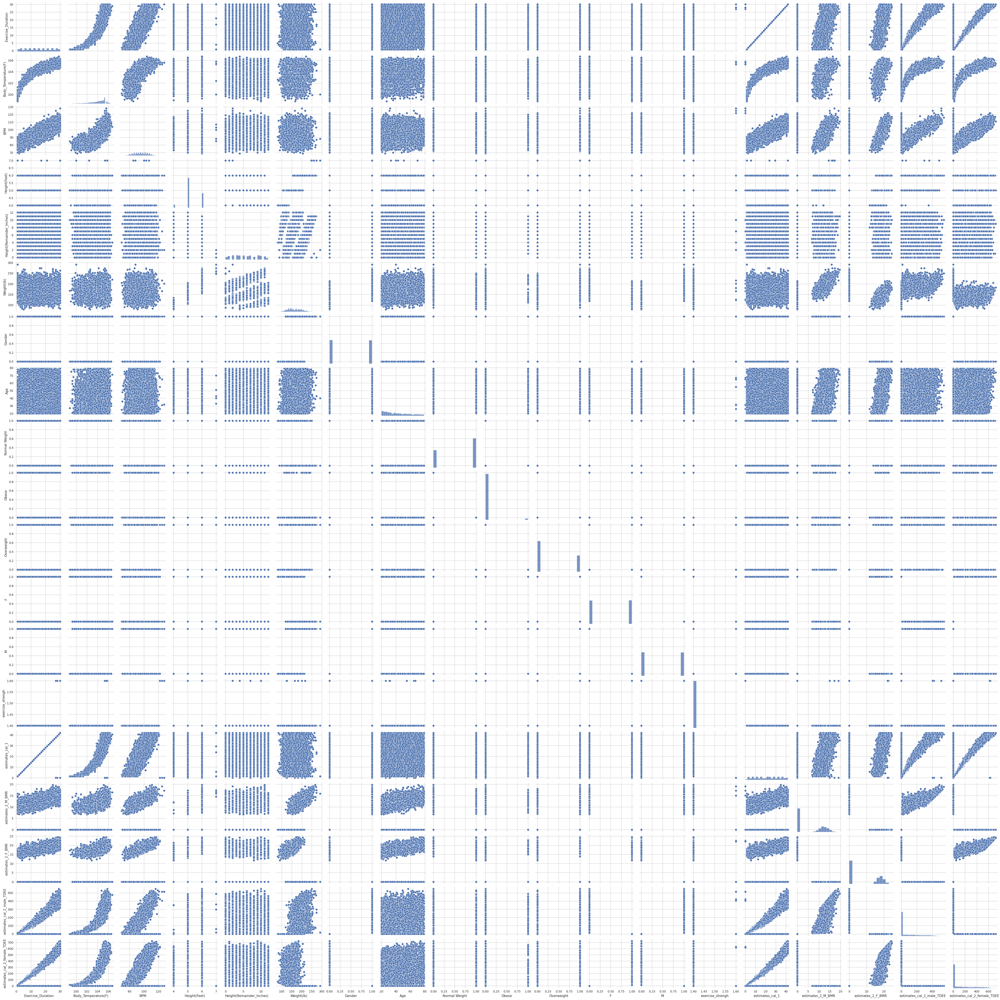

In [ ]:
fig4 = sbs.pairplot(new_label3_7)

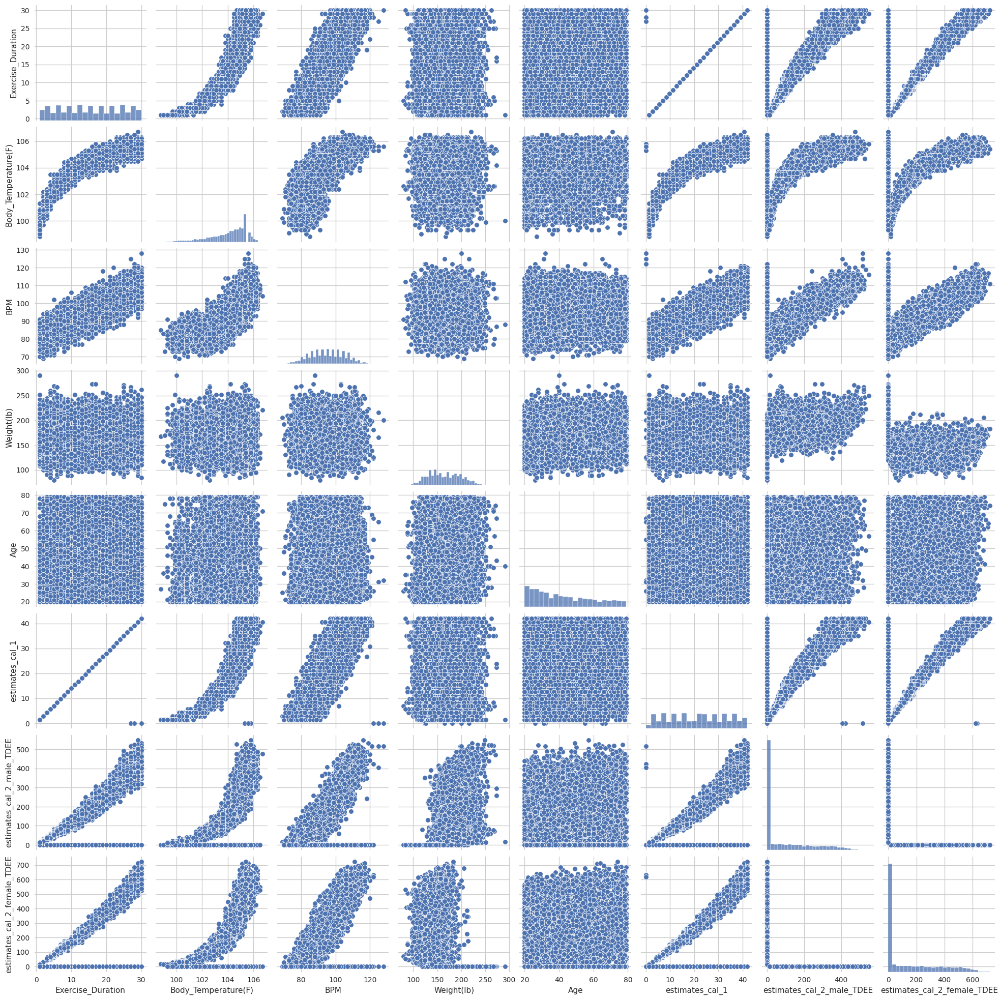

In [ ]:
fig5 = sbs.pairplot(new_label3_10)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(new_label3_7, y1, test_size=0.33, random_state=42)

In [ ]:
from sklearn.linear_model import Lasso
lasso_reg = Lasso(alpha=0.1)
lasso_reg.fit(X_train, y_train)
model = lasso_reg.predict(X_test)
# Reduce error to 4
#  Lasso was Best ################ Data was processed by new_label3_7 ###########  4.122540674000994

In [ ]:
mean_absolute_error(y_test,model)

4.122540674000994

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(new_label3_10, y1, test_size=0.33, random_state=42)

In [ ]:
from sklearn.linear_model import Ridge
ridge_reg = Ridge(alpha=1, solver="cholesky")
ridge_reg.fit(X_train, y_train)
model2 = ridge_reg.predict(X_test)

In [ ]:
mean_absolute_error(y_test,model2) ######################### new_label3_10 Data can process up to 4.120950113860978

4.120950113860978

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(new_label3_10, y1, test_size=0.33, random_state=42)

In [ ]:
# Elastic-Net
from sklearn.linear_model import ElasticNet
elastic_reg = ElasticNet(alpha=0.1, l1_ratio=0.5)
elastic_reg.fit(X_train, y_train)
model3 = elastic_reg.predict(X_test)


In [ ]:
mean_absolute_error(y_test,model3)

4.148474234366568

In [ ]:
# LASSO
fit = Lasso(alpha=0.5, fit_intercept=True, normalize=True, random_state=123).fit(X_train, y_train)
pred_tr = fit.predict(X_train)
pred_te = fit.predict(X_test)

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

In [ ]:
X_training , X_testing , y_training , y_testing = train_test_split(new_label3_10, y1, test_size=0.2 , random_state=0)

In [ ]:
y1

In [ ]:
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

cancer_data=load_breast_cancer()

# X_data=cancer_data.data
# y_label=cancer_data.target

X_train,X_test,y_train,y_test=train_test_split(new_label3_9, y1,test_size=0.2,random_state=0)

knn_clf=KNeighborsClassifier(n_neighbors=4)
rf_clf=RandomForestClassifier(n_estimators=100,random_state=0)
dt_clf=DecisionTreeClassifier()
ada_clf=AdaBoostClassifier(n_estimators=100)

lr_final_clf=LogisticRegression(C=10)

In [ ]:
new_label3_5['BPM']

0       107.0
1        88.0
2        86.0
3        99.0
4        88.0
        ...  
7495    104.0
7496    104.0
7497     90.0
7498     97.0
7499     91.0
Name: BPM, Length: 7500, dtype: float64

In [ ]:
# BMR

In [ ]:
new_label3_5['estimates_2_M_BMR'] =  new_label3_5['M'] * ((-55.0969 + (0.6309 * new_label3_5['BPM'] ) + (0.1988 * new_label3_5['Weight(lb)']) + (0.2017 * new_label3_5['Age'])) / 4.184)

In [ ]:
new_label3_5['estimates_2_F_BMR'] = new_label3_5['F'] *((-20.4022 + (0.6309 * new_label3_5['BPM'] ) + (0.1988 * new_label3_5['Weight(lb)']) + (0.2017 * new_label3_5['Age'])) / 4.184 )

In [ ]:
new_label3_5

,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Gender,Age,Normal Weight,Obese,...,estimates_cal_1,estimates_cal_2,estimates_2_M_BMR,estimates_2_F_BMR,estimates_cal_3_M_BMR_T_CAL,estimates_cal_3_F_BMR_T_CAL,estimates_cal_2_male,estimates_cal_2_female,estimates_cal_2_male_TDEE,estimates_cal_2_female_TDEE
0,26.0,105.6,107.0,5.0,9.0,154.3,0,45,1,0,...,36.4,0,0.000000,20.758948,0.0,0.0,0.000000,20.758948,0.000000,539.732658
1,7.0,103.3,88.0,6.0,6.0,224.9,1,50,0,0,...,9.8,0,13.197280,0.000000,0.0,0.0,13.197280,0.000000,92.380961,0.000000
2,7.0,103.3,86.0,6.0,3.0,218.3,1,29,0,0,...,9.8,0,11.569751,0.000000,0.0,0.0,11.569751,0.000000,80.988260,0.000000
3,17.0,104.0,99.0,5.0,6.0,147.7,0,33,1,0,...,23.8,0,0.000000,18.660554,0.0,0.0,0.000000,18.660554,0.000000,317.229426
4,9.0,102.7,88.0,5.0,10.0,169.8,1,38,1,0,...,12.6,0,10.000750,0.000000,0.0,0.0,10.000750,0.000000,90.006754,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,22.0,105.1,104.0,4.0,10.0,112.4,0,75,1,0,...,30.8,0,0.000000,19.761955,0.0,0.0,0.000000,19.761955,0.000000,434.763011
7496,20.0,105.3,104.0,5.0,8.0,147.7,0,21,1,0,...,28.0,0,0.000000,18.836009,0.0,0.0,0.000000,18.836009,0.000000,376.720172
7497,8.0,103.1,90.0,6.0,2.0,202.8,1,57,0,0,...,11.2,0,12.786243,0.000000,0.0,0.0,12.786243,0.000000,102.289943,0.000000
7498,12.0,104.4,97.0,5.0,9.0,167.6,1,35,0,0,...,16.8,0,11.108695,0.000000,0.0,0.0,11.108695,0.000000,133.304340,0.000000


In [ ]:
new_label3_5['estimates_cal_2_male_TDEE'] = 0

In [ ]:
new_label3_5['estimates_cal_2_female_TDEE'] = 0

In [ ]:
new_label3_6

In [ ]:
new_label3_5['estimates_cal_2_male_TDEE'] = new_label3_5['Exercise_Duration'] * new_label3_5['estimates_cal_2_male']

In [ ]:
new_label3_5['estimates_cal_2_female_TDEE'] = new_label3_5['Exercise_Duration'] * new_label3_5['estimates_cal_2_female']

In [ ]:
new_label3_5

,Exercise_Duration,Body_Temperature(F),BPM,Height(Feet),Height(Remainder_Inches),Weight(lb),Gender,Age,Normal Weight,Obese,...,estimates_cal_1,estimates_cal_2,estimates_2_M_BMR,estimates_2_F_BMR,estimates_cal_3_M_BMR_T_CAL,estimates_cal_3_F_BMR_T_CAL,estimates_cal_2_male,estimates_cal_2_female,estimates_cal_2_male_TDEE,estimates_cal_2_female_TDEE
0,26.0,105.6,107.0,5.0,9.0,154.3,0,45,1,0,...,36.4,0,0,0,0.0,0.0,0.000000,20.758948,0.000000,539.732658
1,7.0,103.3,88.0,6.0,6.0,224.9,1,50,0,0,...,9.8,0,0,0,0.0,0.0,13.197280,0.000000,92.380961,0.000000
2,7.0,103.3,86.0,6.0,3.0,218.3,1,29,0,0,...,9.8,0,0,0,0.0,0.0,11.569751,0.000000,80.988260,0.000000
3,17.0,104.0,99.0,5.0,6.0,147.7,0,33,1,0,...,23.8,0,0,0,0.0,0.0,0.000000,18.660554,0.000000,317.229426
4,9.0,102.7,88.0,5.0,10.0,169.8,1,38,1,0,...,12.6,0,0,0,0.0,0.0,10.000750,0.000000,90.006754,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,22.0,105.1,104.0,4.0,10.0,112.4,0,75,1,0,...,30.8,0,0,0,0.0,0.0,0.000000,19.761955,0.000000,434.763011
7496,20.0,105.3,104.0,5.0,8.0,147.7,0,21,1,0,...,28.0,0,0,0,0.0,0.0,0.000000,18.836009,0.000000,376.720172
7497,8.0,103.1,90.0,6.0,2.0,202.8,1,57,0,0,...,11.2,0,0,0,0.0,0.0,12.786243,0.000000,102.289943,0.000000
7498,12.0,104.4,97.0,5.0,9.0,167.6,1,35,0,0,...,16.8,0,0,0,0.0,0.0,11.108695,0.000000,133.304340,0.000000


In [ ]:
label4

0       166.0
1        33.0
2        23.0
3        91.0
4        32.0
        ...  
7495    151.0
7496    114.0
7497     41.0
7498     57.0
7499     59.0
Name: Calories_Burned, Length: 7500, dtype: float64

In [ ]:
new_label3_5['estimates_cal_1'] = new_label3_5['Exercise_Duration'] * new_label3_5['exercise_strengh']

In [ ]:
# Created Column by formula 2

In [ ]:
new_label3_5['exercise_strengh'].max()

1.4

In [ ]:
# Created Column by formula 3

In [ ]:
############################## Modeling ###################################

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(major_factors, y1, test_size=0.333, random_state=42)

In [ ]:
# Ridge
fit = Ridge(alpha=0.5, fit_intercept=True, normalize=True, random_state=123).fit(x_train, y_train)
pred_tr = fit.predict(x_train)
pred_te = fit.predict(x_test)

In [ ]:
from sklearn.preprocessing import PolynomialFeatures

In [ ]:
transformed_X

In [ ]:
transformed_XV

In [ ]:
df_poly = pd.DataFrame(x_poly)
test_poly = pd.DataFrame(xv_poly)
#new_poly = pd.DataFrame(new_label3_10)

In [ ]:
from sklearn.tree import DecisionTreeClassifier



model = DecisionTreeClassifier()
################## Decesion Tree ###################

model.fit(df_poly,y_train)
pred = model.predict(test_poly)

In [ ]:
# Create a lineat regression object
lin_reg = linear_model.LinearRegression()
############## Linear Regression error 7% ########################

In [ ]:

# Train the model using the training sets
lin_reg.fit(x_poly   ,y_train)



In [ ]:
# Predicting
lin_model = lin_reg.predict(xv_poly)

In [ ]:
from sklearn.metrics import r2_score,mean_absolute_error

In [ ]:
r2_score(lin_model, y_test)

In [ ]:
r2_score(pred, y_test)

In [ ]:
mean_absolute_error(y_test,lin_model)

In [ ]:
mean_absolute_error(y_test,y_pred)